<a href="https://colab.research.google.com/github/JahnaviRamagiri/EVA-B2/blob/master/S11_superconvergence/S11_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Memory Information

In [ ]:
import psutil
def get_size(bytes, suffix="B"):
    factor = 1024
    for unit in ["", "K", "M", "G", "T", "P"]:
        if bytes < factor:
            return f"{bytes:.2f}{unit}{suffix}"
        bytes /= factor
print("="*40, "Memory Information", "="*40)
svmem = psutil.virtual_memory()
print(f"Total: {get_size(svmem.total)}") ; print(f"Available: {get_size(svmem.available)}")
print(f"Used: {get_size(svmem.used)}") ; print(f"Percentage: {svmem.percent}%")

======================================== Memory Information ========================================
Total: 25.51GB
Available: 24.54GB
Used: 636.34MB
Percentage: 3.8%


# GPU Information

In [ ]:
!pip install albumentations==0.4.5 --quiet

     |████████████████████████████████| 122kB 2.8MB/s 
     |████████████████████████████████| 634kB 8.6MB/s 


In [ ]:
!nvidia-smi

Sat Jun 20 16:47:43 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    24W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
device = 'cuda'
from S11_model import S11_Model

In [ ]:
import cv2
model = S11_Model().to(device)

In [ ]:
from augmentation import CIFAR10_AlbumTrans
from data import CIFAR10DataLoader
from data_summary import model_summary, display


Extracting ./root/cifar-10-python.tar.gz to ./root
Files already downloaded and verified


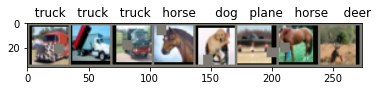

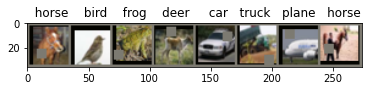

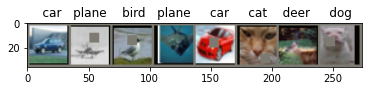

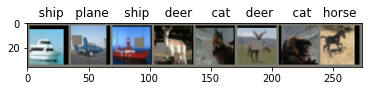

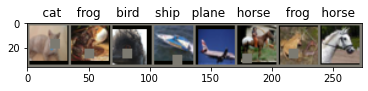

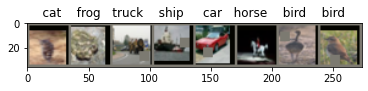

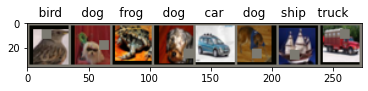

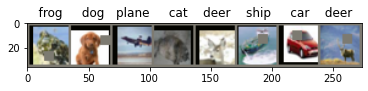

In [ ]:
trans = CIFAR10_AlbumTrans()
data = CIFAR10DataLoader(trans, batch_size=512)
train_loader, test_loader = data.get_loaders()
display(train_loader, 64)

In [ ]:
model_summary(model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
              ReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4          [-1, 128, 32, 32]          73,728
         MaxPool2d-5          [-1, 128, 16, 16]               0
       BatchNorm2d-6          [-1, 128, 16, 16]             256
            Conv2d-7          [-1, 128, 16, 16]         147,456
       BatchNorm2d-8          [-1, 128, 16, 16]             256
            Conv2d-9          [-1, 128, 16, 16]         147,456
      BatchNorm2d-10          [-1, 128, 16, 16]             256
    BasicResBlock-11          [-1, 128, 16, 16]               0
    ParallelBlock-12          [-1, 128, 16, 16]               0
           Conv2d-13          [-1, 256, 16, 16]         294,912
        MaxPool2d-14            [-1, 25

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
#from find_lr import LRFinder
from lr_finder import LRFinder

  pip install torch-lr-finder -v --global-option="amp"


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=1e-6, momentum= 0.9)
lr_finder = LRFinder(model, optimizer, criterion, device="cuda")
lr_finder.range_test(train_loader, end_lr=0.1, num_iter=10 * len(train_loader), step_mode="exp")


Learning rate search finished. See the graph with {finder_name}.plot()


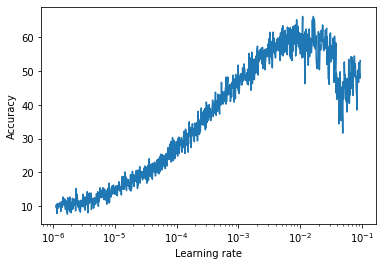

Best acc 66.2109375
Best LR:  0.01096065651201893


In [ ]:
lr_finder.plot(plot_case="acc")
best_lr = lr_finder.get_best_lr(case="acc")

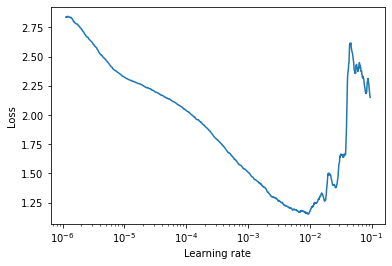

Best loss 1.1508058843750388
Best LR:  0.0092968331284346


In [ ]:
lr_finder.plot(plot_case="loss")
best_loss_lr = lr_finder.get_best_lr(case="loss")

In [ ]:
lr_finder.reset()

  0%|          | 0/98 [00:00<?, ?it/s]

====================START====================
==================== EPOCH: 1 ====================


Loss=1.7474031448364258 Batch_id=97 Accuracy=28.33: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.0003425205160005919



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 3766/10000 (37.66%)

==================== EPOCH: 2 ====================


Loss=1.1767215728759766 Batch_id=97 Accuracy=47.84: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.0018975105308369905



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 5740/10000 (57.40%)

==================== EPOCH: 3 ====================


Loss=1.0167021751403809 Batch_id=97 Accuracy=58.50: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]


 Current LR: 0.005651588514009761



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 6322/10000 (63.22%)

==================== EPOCH: 4 ====================


Loss=0.7002148628234863 Batch_id=97 Accuracy=66.21: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.009405666497182531



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 7052/10000 (70.52%)

==================== EPOCH: 5 ====================


Loss=0.8247009515762329 Batch_id=97 Accuracy=74.55: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.01096065651201893



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0014, Accuracy: 7504/10000 (75.04%)

==================== EPOCH: 6 ====================


Loss=0.642316997051239 Batch_id=97 Accuracy=78.57: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.010888247744379766



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 7489/10000 (74.89%)

==================== EPOCH: 7 ====================


Loss=0.6050336956977844 Batch_id=97 Accuracy=81.35: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.010672996563887902



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8072/10000 (80.72%)

==================== EPOCH: 8 ====================


Loss=0.43876147270202637 Batch_id=97 Accuracy=84.12: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]


 Current LR: 0.010320774461629208



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8092/10000 (80.92%)

==================== EPOCH: 9 ====================


Loss=0.40708819031715393 Batch_id=97 Accuracy=85.81: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.009841189138378809



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8197/10000 (81.97%)

==================== EPOCH: 10 ====================


Loss=0.4182778298854828 Batch_id=97 Accuracy=86.78: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.009247322431569338



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8427/10000 (84.27%)

==================== EPOCH: 11 ====================


Loss=0.3733907639980316 Batch_id=97 Accuracy=88.00: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.008555373476867597



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 8389/10000 (83.89%)

==================== EPOCH: 12 ====================


Loss=0.30254048109054565 Batch_id=97 Accuracy=89.17: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.007784216837981545



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8514/10000 (85.14%)

==================== EPOCH: 13 ====================


Loss=0.34565144777297974 Batch_id=97 Accuracy=90.41: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.006954887657764669



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8523/10000 (85.23%)

==================== EPOCH: 14 ====================


Loss=0.3003561198711395 Batch_id=97 Accuracy=91.21: 100%|██████████| 98/98 [00:13<00:00,  7.13it/s]


 Current LR: 0.006090007874353464



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8634/10000 (86.34%)

==================== EPOCH: 15 ====================


Loss=0.26252537965774536 Batch_id=97 Accuracy=92.36: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.005213169153666058



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8695/10000 (86.95%)

==================== EPOCH: 16 ====================


Loss=0.2144002467393875 Batch_id=97 Accuracy=93.22: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.004348289370254853



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8588/10000 (85.88%)

==================== EPOCH: 17 ====================


Loss=0.1837538778781891 Batch_id=97 Accuracy=94.14: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.0035189601900379778



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 8868/10000 (88.68%)

==================== EPOCH: 18 ====================


Loss=0.1467704176902771 Batch_id=97 Accuracy=95.07: 100%|██████████| 98/98 [00:13<00:00,  7.09it/s]


 Current LR: 0.0027478035511519262



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 8956/10000 (89.56%)

==================== EPOCH: 19 ====================


Loss=0.14011448621749878 Batch_id=97 Accuracy=95.70: 100%|██████████| 98/98 [00:13<00:00,  7.09it/s]


 Current LR: 0.002055854596450185



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 9041/10000 (90.41%)

==================== EPOCH: 20 ====================


Loss=0.13578979671001434 Batch_id=97 Accuracy=96.28: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.001461987889640714



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 9092/10000 (90.92%)

==================== EPOCH: 21 ====================


Loss=0.11613371223211288 Batch_id=97 Accuracy=96.68: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.000982402566390312



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0005, Accuracy: 9097/10000 (90.97%)

==================== EPOCH: 22 ====================


Loss=0.11628834158182144 Batch_id=97 Accuracy=97.13: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]


 Current LR: 0.0006301804641316178



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0005, Accuracy: 9113/10000 (91.13%)

==================== EPOCH: 23 ====================


Loss=0.08946102112531662 Batch_id=97 Accuracy=97.39: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.000414929283639755



  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0005, Accuracy: 9153/10000 (91.53%)

==================== EPOCH: 24 ====================


Loss=0.09790637344121933 Batch_id=97 Accuracy=97.55: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]


 Current LR: 0.00034252051600059156



Test set: Average loss: 0.0005, Accuracy: 9150/10000 (91.50%)



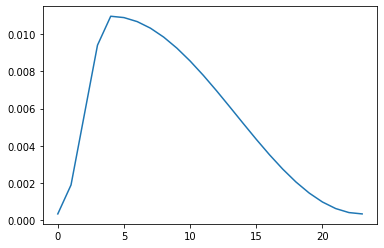

In [ ]:
from test import Test
from train import Train
from torch.optim.lr_scheduler import OneCycleLR #ReduceLROnPlateau
import matplotlib.pyplot as plt



#for i in range (32,33):
  #optimizer = optim.SGD(model.parameters(), lr=best_lr, momentum= 0.9,weight_decay=0.01)

  #scheduler =torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode= 'max', patience= 2)
lr_list = []
  
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), best_lr, momentum=0.9, weight_decay=1e-2) #, nesterov=True, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer,
                  max_lr=best_lr,
                  total_steps=24,
                  steps_per_epoch = len(train_loader),
                  epochs=24,
                  pct_start=5/24,
                  cycle_momentum=False,
                  div_factor=32,
                  final_div_factor=1,
                  anneal_strategy ='cos',
                  #annihilation_frac=0,
                  last_epoch=-1)
 # print('='*30 + f' div: {i} ' + '='*30)
epochs = 24
print('='*20 + 'START' + '='*20)
test = Test(model, device, test_loader)
train = Train(model, device, train_loader, optimizer)
for epoch in range(epochs):
    print('='*20 + f' EPOCH: {epoch+1} ' + '='*20)
    train.train(epoch)
    lr_list.append(optimizer.param_groups[0]['lr'])
    print('\n Current LR:',lr_list[epoch])
    test.test()
    scheduler.step() #Have to give the val_loss or val_accuracy here. The metric on which we can to check 
    #test.test()
  #fig, axs = plt.subplots(4,1,figsize=(15,10))
plt.plot(lr_list)
   

In [ ]:
import plot
from plot import mis, gen_cam, plot_pred_cam, plot_act_cam

In [ ]:
best_model = S11_Model().to(device)
best_model.load_state_dict(torch.load('/content/classifier.pt'))
best_model.eval()
print('Best Model Loaded!')

Best Model Loaded!


Directory  /content/mis_class/  Created 
Directory  /content/mis_class/images  Created 

Test set: Average loss: -7.7352, Accuracy: 9153/10000 (91.53%)

torch.Size([847, 3, 32, 32])


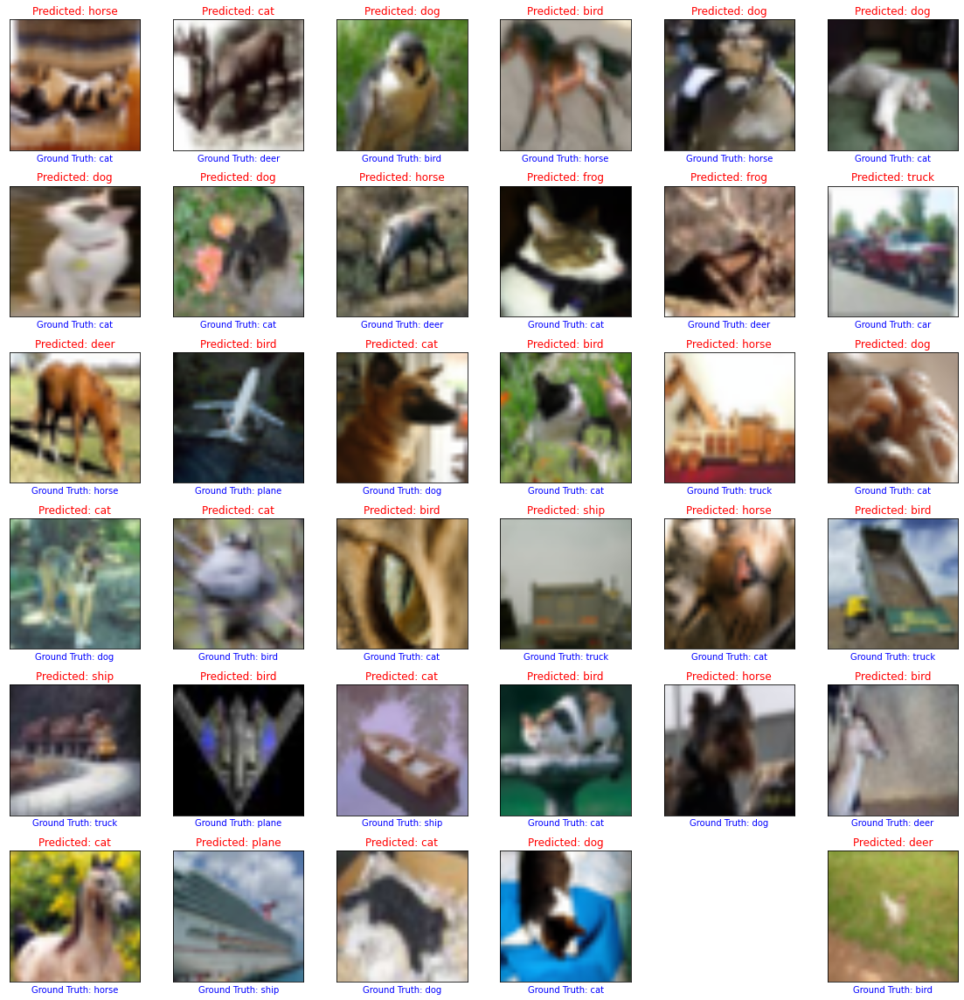

In [ ]:
mis(best_model, device, test_loader, 36)

In [ ]:
layers = ['layer1', 'layer2', 'layer3',]
for layer in layers:
  gen_cam(best_model, layer) #GradCAM for Misclassified w.r.t Predicted Class
  gen_cam(best_model, layer, class_idx= plot.true_list) #GradCAM for Misclassified w.r.t Actual Class

Directory  /content/result_pred/  Created 
Directory  /content/heatmap_pred/  Created 
Directory  /content/result_act/  Created 
Directory  /content/heatmap_act/  Created 
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists


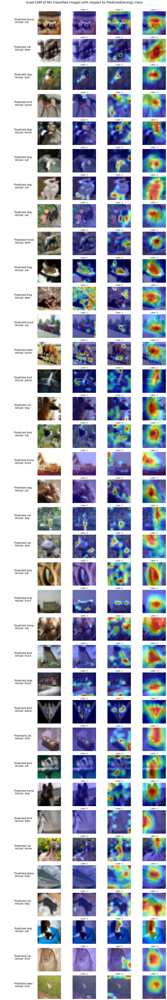

In [ ]:
plot_pred_cam(36, 3)

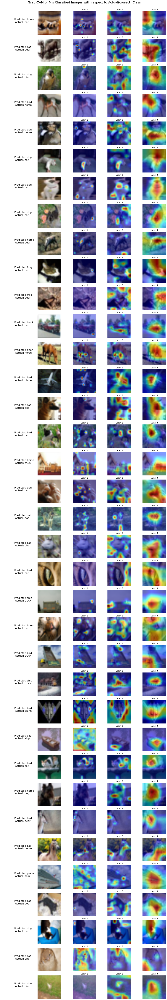

In [ ]:
plot_act_cam(36,3)

In [ ]:
from graphs import acc_loss, testvtrain, class_acc

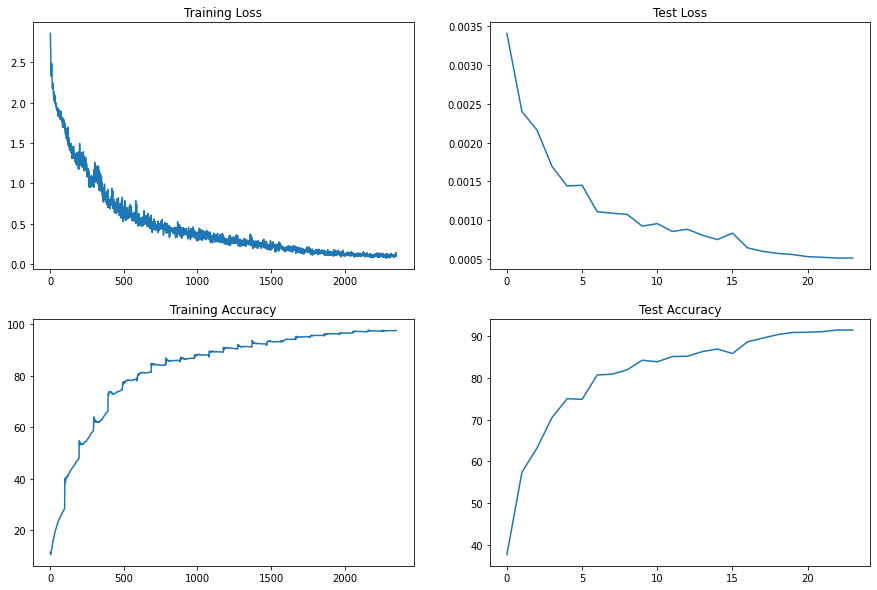

In [ ]:
acc_loss(train, test)

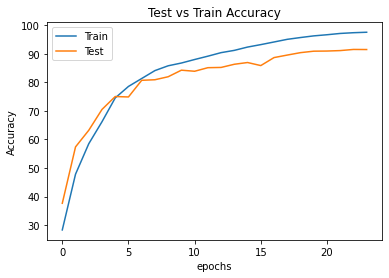

In [ ]:
testvtrain(train, test)

In [ ]:
class_acc(model, device, test_loader)

Accuracy of plane : 95 %
Accuracy of   car : 97 %
Accuracy of  bird : 89 %
Accuracy of   cat : 82 %
Accuracy of  deer : 92 %
Accuracy of   dog : 85 %
Accuracy of  frog : 93 %
Accuracy of horse : 92 %
Accuracy of  ship : 94 %
Accuracy of truck : 90 %


In [ ]:
optimizer.param_groups[0]['lr']

0.00041492928363975445

In [ ]:
len(lr_list)

24

In [ ]:
set_lr = set(lr_list)

In [ ]:
len(set_lr)

24

In [ ]:
set_lr

{0.00034252051600059156,
 0.0003425205160005919,
 0.000414929283639755,
 0.0006301804641316178,
 0.000982402566390312,
 0.001461987889640714,
 0.0018975105308369905,
 0.002055854596450185,
 0.0027478035511519262,
 0.0035189601900379778,
 0.004348289370254853,
 0.005213169153666058,
 0.005651588514009761,
 0.006090007874353464,
 0.006954887657764669,
 0.007784216837981545,
 0.008555373476867597,
 0.009247322431569338,
 0.009405666497182531,
 0.009841189138378809,
 0.010320774461629208,
 0.010672996563887902,
 0.010888247744379766,
 0.01096065651201893}

In [ ]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'Learning Rate')

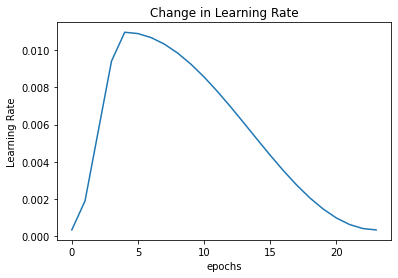

In [ ]:
plt.plot(lr_list)
plt.title('Change in Learning Rate')
plt.xlabel('epochs')
plt.ylabel('Learning Rate')

Text(0, 0.5, 'Learning Rate')

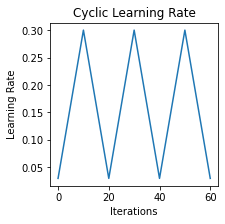

In [ ]:
 #code for cyclic triangle
  import matplotlib.pyplot as plt
  step_size = 10
  no_cycle=3
  max_lr = 0.3
  min_lr = max_lr/10

  total_iter = no_cycle*(2*step_size)

  lr_list = [min_lr]

  for i in range(1, total_iter+1):
    cycle = int(1 + i/(2*step_size))
    x = abs((i/step_size) - (2*cycle) + 1)
    curr_lr = min_lr + (max_lr - min_lr)*(1-x)
    lr_list.append(curr_lr)

  plt.figure(figsize= (no_cycle, 3))
  plt.plot(lr_list)
  plt.title('Cyclic Learning Rate')
  plt.xlabel('Iterations')
  plt.ylabel('Learning Rate')